In [1]:
%pip install opencv-python numpy matplotlib

Note: you may need to restart the kernel to use updated packages.


In [15]:
import os
from pathlib import Path
import cv2
import numpy as np
import re

INPUT_DIR = Path("big")       
OUTPUT_DIR = Path("images_processed")   
IMG_SIZE = (640, 480)  

IMAGE_EXTS = {".png", ".jpg", ".jpeg"}

def process_image_edges(img_bgr: np.ndarray):
    #  resize do spójnego rozmiaru IMG_SIZE
    img = cv2.resize(img_bgr, IMG_SIZE)
    # img = img_bgr
    h, w = img.shape[:2] # wymiary po resize
    
    # konwersja na szarość
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # CLAHE kontrast
    # clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))
    # gray = clahe.apply(gray)

    # korrekcja gamma
    
    
    # rozmycie (gaussian blur)
    # blurred = cv2.GaussianBlur(gray, (7, 7), 0)
    blurred = cv2.GaussianBlur(gray, (9, 9), 0)
    # Bilateral Filter ostre krawedzi 
    # blurred = cv2.bilateralFilter(gray, 9, 75, 75)
    
    # dynamiczne progi Canny
    # mediana jasności obrazu
    v = np.median(blurred)
    sigma = 0.33
    # wyliczenie dolnego i górnego progu
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    
    # detekcja krawędzi z dynamicznymi progami
    edges = cv2.Canny(blurred, lower, upper)
    
    # Region of Interest (ROI)
    # zerujemy górne 20% obrazu ucinamy ze zdjecia perspektywę 
    roi_limit = int(h * 0.20) 
    edges[0:roi_limit, :] = 0 
    
    # operacje morfologiczne
    # dylatacja (pogrubienie) - połączenie przerywanych krawędzi
    kernel_dilate = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    thick_edges = cv2.dilate(edges, kernel_dilate, iterations=2)
    
    # zamknięcie - wypełnienie dziur wewnątrz krawędzi
    kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    closed_mask = cv2.morphologyEx(thick_edges, cv2.MORPH_CLOSE, kernel_close)
    
    return closed_mask, img

def detect_and_draw(binary_mask, original_img):
    output_img = original_img.copy()
    h_img, w_img = binary_mask.shape
    
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    pothole_count = 0
    contours = sorted(contours, key=cv2.contourArea, reverse=True)
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        x, y, w, h = cv2.boundingRect(cnt)
        
        # ignorowanie obiektów na krawędzi zdjęcia
        if x <= 1 or y + h >= h_img - 1 or x + w >= w_img - 1:
            continue

        if area < 400: 
            continue
 
        # aspect ratio (proporcje)
        aspect_ratio = float(w)/h
        # usuwamy pionowe kreski i bardzo płaskie obiekty
        if aspect_ratio < 0.3 or aspect_ratio > 4.0:
            continue
            
        # solidity (zwartość)
        hull = cv2.convexHull(cnt)
        hull_area = cv2.contourArea(hull)
        if hull_area == 0: continue
        solidity = float(area)/hull_area
        
        # bardziej nie regularne obiekty (dziury)
        if solidity < 0.45:
            continue

        # rysowanie
        cv2.rectangle(output_img, (x, y), (x+w, y+h), (0, 0, 255), 2)
        cv2.putText(output_img, f"Dziura ({int(area)})", (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)
        
        pothole_count += 1
        
    return output_img, pothole_count
def list_images(input_dir: Path):
    paths = []
    for root, _, files in os.walk(input_dir):
        for f in files:
            ext = Path(f).suffix.lower()
            if ext in IMAGE_EXTS:
                paths.append(Path(root) / f)
    
    # Sortowanie naturalne (klucz sortowania rozbija tekst na liczby i napisy)
    return sorted(paths, key=lambda p: [int(c) if c.isdigit() else c.lower() for c in re.split(r'(\d+)', p.name)])

def main():
    image_paths = list_images(INPUT_DIR)
    if not image_paths:
        print(f"Brak obrazów w: {INPUT_DIR.resolve()}")
        return

    print(f"Znaleziono {len(image_paths)} obrazów.")

    for img_path in image_paths:
        rel_path = img_path.relative_to(INPUT_DIR)
        out_path_base = OUTPUT_DIR / rel_path.stem

        OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

        img_bgr = cv2.imread(str(img_path))
        if img_bgr is None:
            continue

        # preprocessing (Edges)
        mask, resized_original = process_image_edges(img_bgr)
        
        # detekcja
        final_result, count = detect_and_draw(mask, resized_original)

        cv2.imwrite(f"{out_path_base}_edges.png", mask)
        cv2.imwrite(f"{out_path_base}_result.png", final_result)
        
        print(f"Przetworzono: {img_path.name} -> Wykryto: {count}")

    print(f"Gotowe. Sprawdź folder: {OUTPUT_DIR.resolve()}")

if __name__ == "__main__":
    main()

Znaleziono 255 obrazów.
Przetworzono: potholes0.png -> Wykryto: 14
Przetworzono: potholes13.png -> Wykryto: 6
Przetworzono: potholes14.png -> Wykryto: 3
Przetworzono: potholes15.png -> Wykryto: 7
Przetworzono: potholes16.png -> Wykryto: 6
Przetworzono: potholes19.png -> Wykryto: 5
Przetworzono: potholes30.png -> Wykryto: 2
Przetworzono: potholes33.png -> Wykryto: 4
Przetworzono: potholes58.png -> Wykryto: 9
Przetworzono: potholes68.png -> Wykryto: 9
Przetworzono: potholes81.png -> Wykryto: 5
Przetworzono: potholes87.png -> Wykryto: 6
Przetworzono: potholes97.png -> Wykryto: 8
Przetworzono: potholes108.png -> Wykryto: 9
Przetworzono: potholes114.png -> Wykryto: 8
Przetworzono: potholes167.png -> Wykryto: 12
Przetworzono: potholes177.png -> Wykryto: 10
Przetworzono: potholes195.png -> Wykryto: 3
Przetworzono: potholes196.png -> Wykryto: 6
Przetworzono: potholes201.png -> Wykryto: 9
Przetworzono: potholes202.png -> Wykryto: 6
Przetworzono: potholes208.png -> Wykryto: 2
Przetworzono: potho

In [ ]:
import os
import uuid

def rename_files_to_uuid(folder_path):
    """
    Iterates through a folder and renames all files to random UUIDs
    while preserving their original file extensions.
    """
    
    # Check if the folder exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder '{folder_path}' does not exist.")
        return

    # Counter for tracking
    count = 0

    print(f"Starting rename process in: {folder_path}")
    print("-" * 40)

    # Iterate over every item in the directory
    for filename in os.listdir(folder_path):
        old_path = os.path.join(folder_path, filename)

        # Check if it is a file (ignore sub-directories)
        if os.path.isfile(old_path):
            # Get the file extension (e.g., .jpg, .txt)
            _, extension = os.path.splitext(filename)
            
            # Generate a random UUID
            new_filename = str(uuid.uuid4()) + extension
            new_path = os.path.join(folder_path, new_filename)

            # Rename the file
            os.rename(old_path, new_path)
            
            print(f"Renamed: {filename} -> {new_filename}")
            count += 1

    print("-" * 40)
    print(f"Process Complete. Total files renamed: {count}")

# --- CONFIGURATION ---
# Replace the path below with the actual path to your folder
target_folder = "./big" 

# Run the function
rename_files_to_uuid(target_folder)

Znaleziono 77 obrazów.
Przetworzono: potholes0.png -> Wykryto: 14


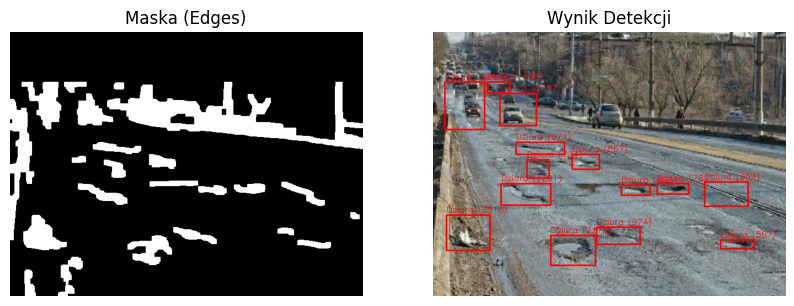

Przetworzono: potholes13.png -> Wykryto: 6


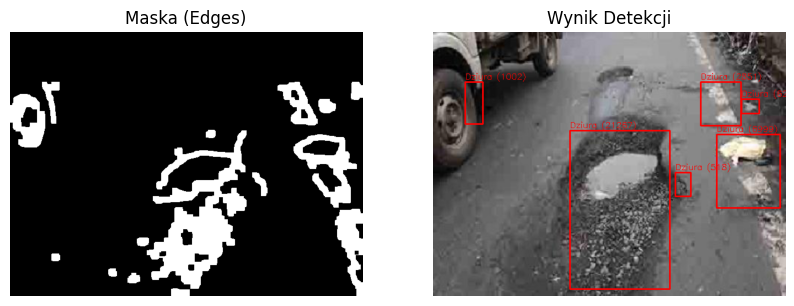

Przetworzono: potholes14.png -> Wykryto: 3


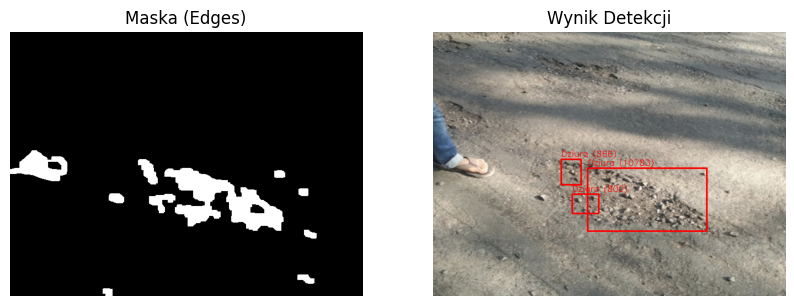

Przetworzono: potholes15.png -> Wykryto: 7


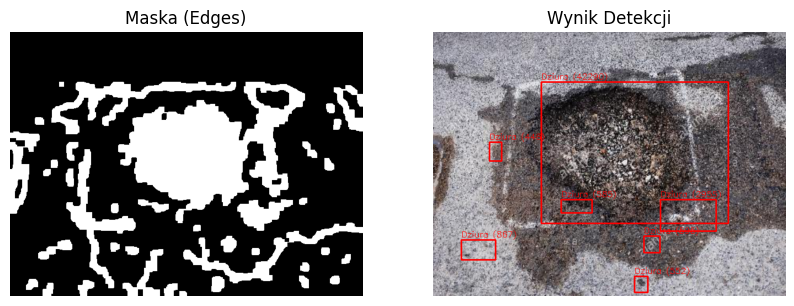

Przetworzono: potholes16.png -> Wykryto: 6


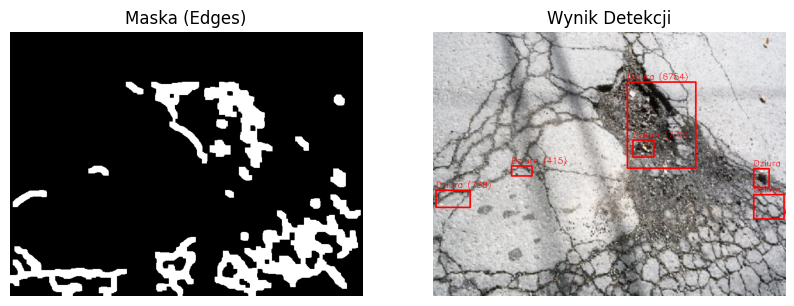

Przetworzono: potholes19.png -> Wykryto: 5


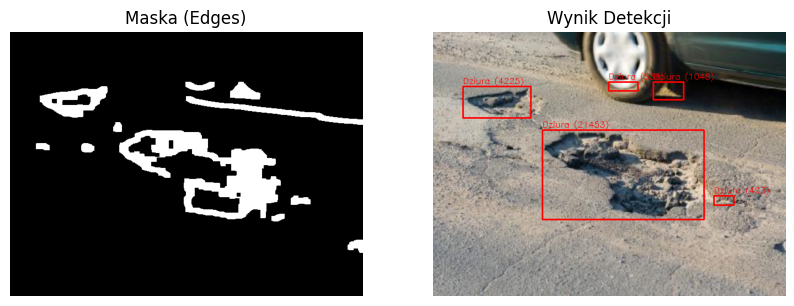

Przetworzono: potholes30.png -> Wykryto: 2


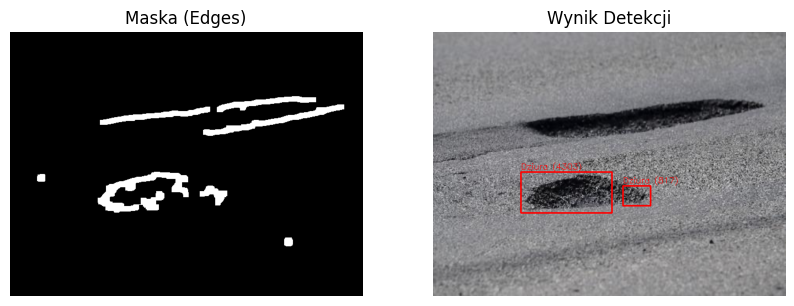

Przetworzono: potholes33.png -> Wykryto: 4


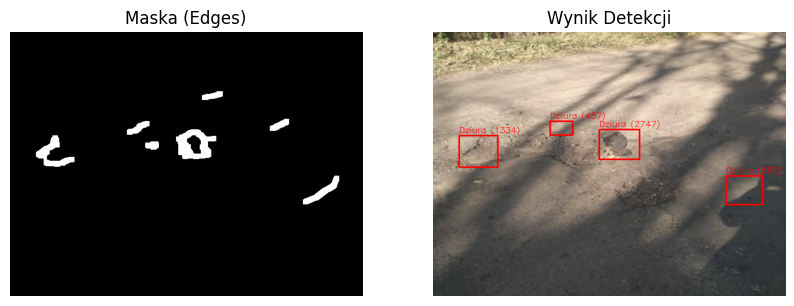

Przetworzono: potholes58.png -> Wykryto: 9


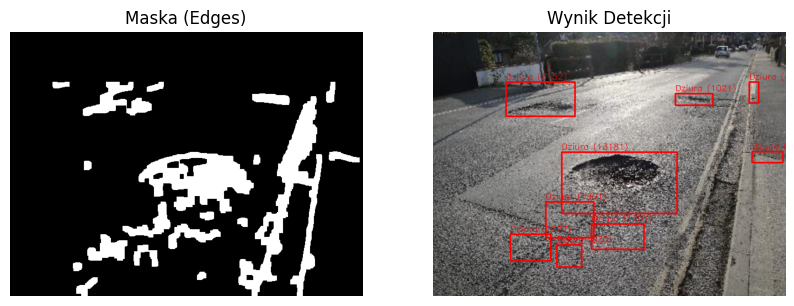

Przetworzono: potholes68.png -> Wykryto: 9


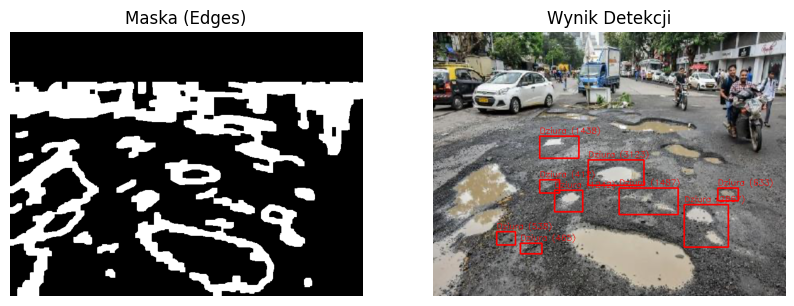

Przetworzono: potholes81.png -> Wykryto: 5


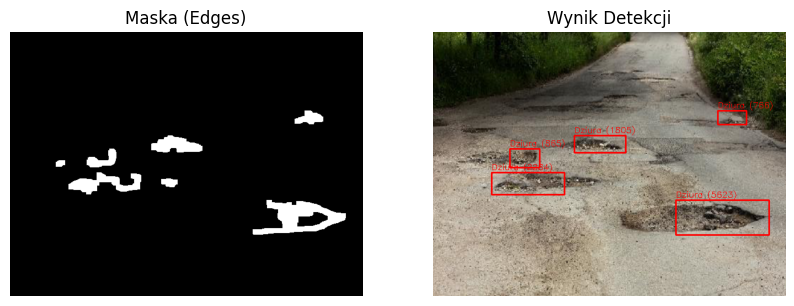

Przetworzono: potholes87.png -> Wykryto: 6


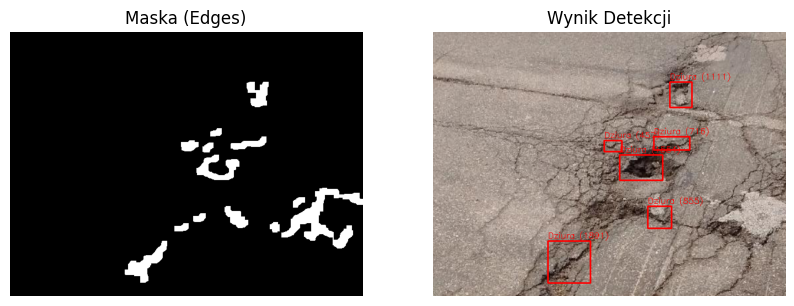

Przetworzono: potholes97.png -> Wykryto: 8


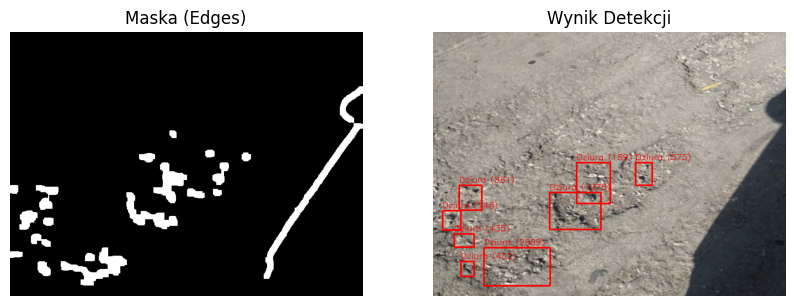

Przetworzono: potholes108.png -> Wykryto: 9


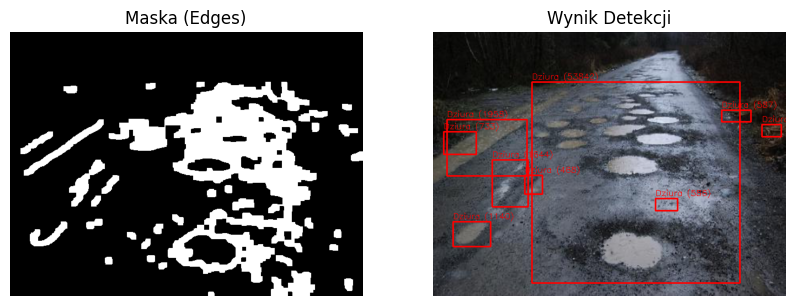

Przetworzono: potholes114.png -> Wykryto: 8


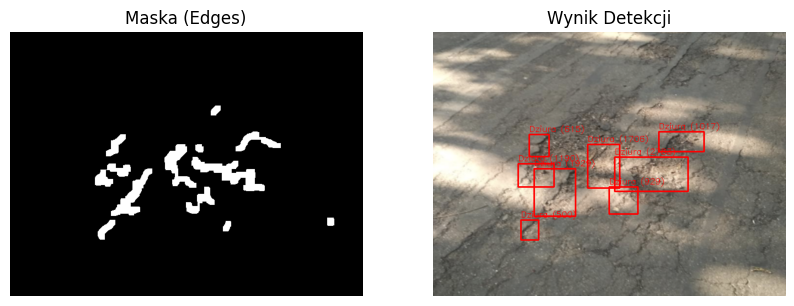

Przetworzono: potholes167.png -> Wykryto: 12


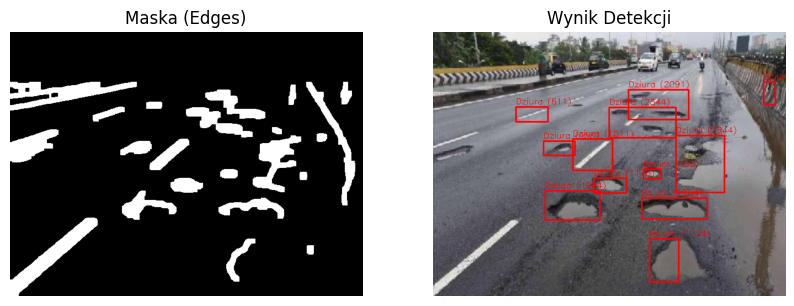

Przetworzono: potholes177.png -> Wykryto: 10


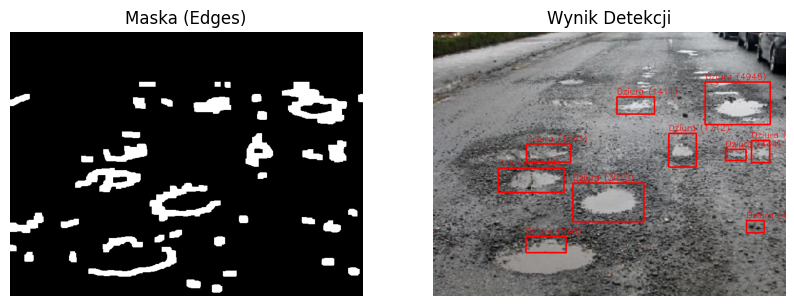

Przetworzono: potholes195.png -> Wykryto: 3


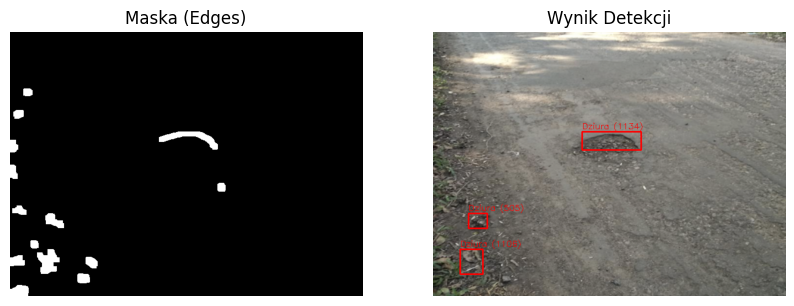

Przetworzono: potholes196.png -> Wykryto: 6


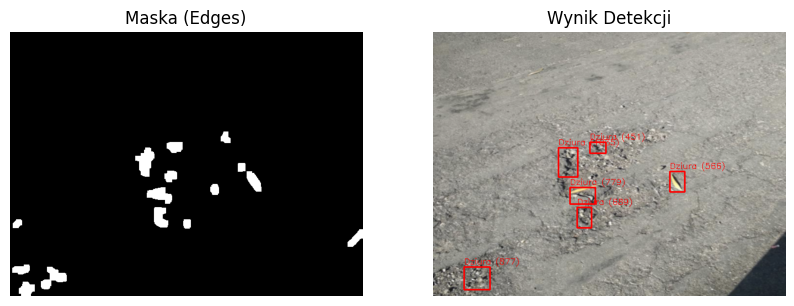

Przetworzono: potholes201.png -> Wykryto: 9


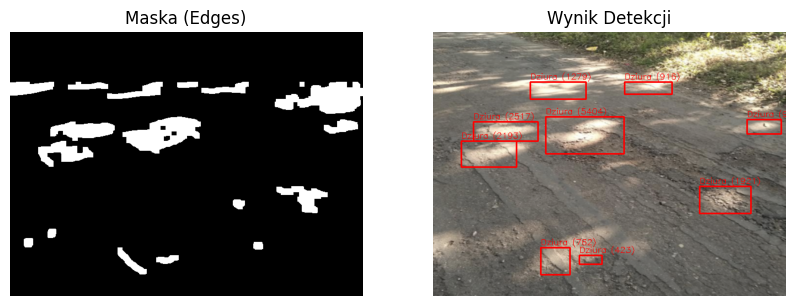

Przetworzono: potholes202.png -> Wykryto: 6


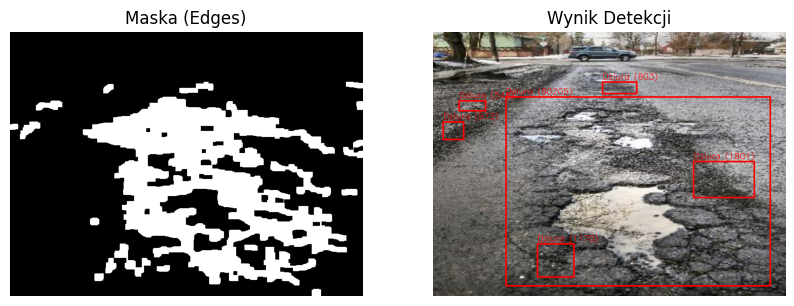

Przetworzono: potholes208.png -> Wykryto: 2


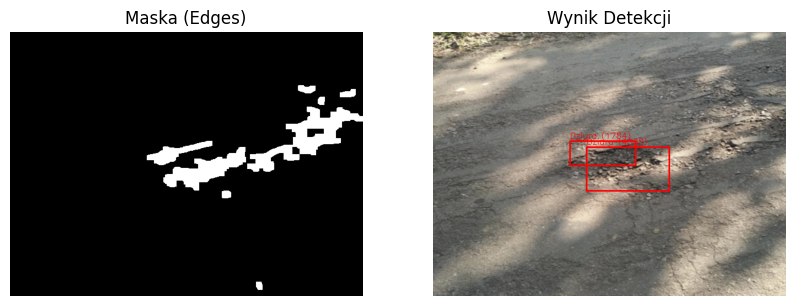

Przetworzono: potholes209.png -> Wykryto: 3


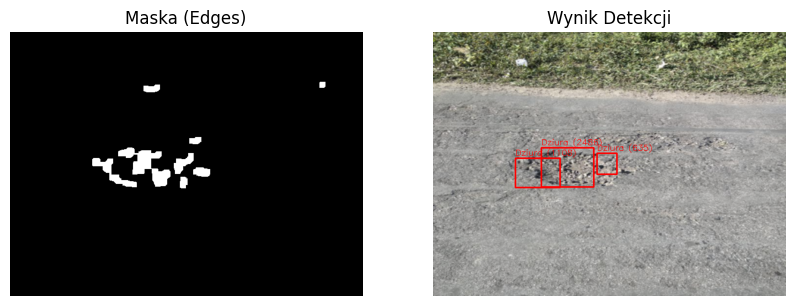

Przetworzono: potholes210.png -> Wykryto: 4


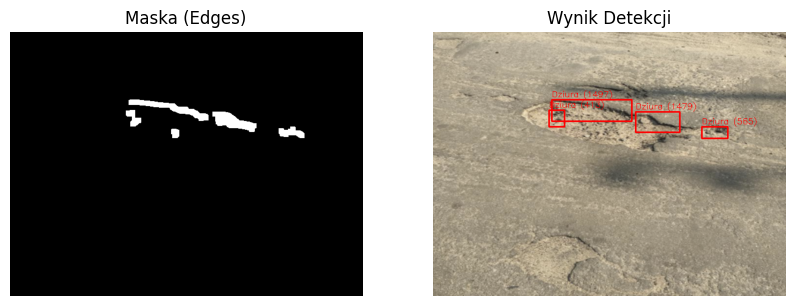

Przetworzono: potholes211.png -> Wykryto: 0


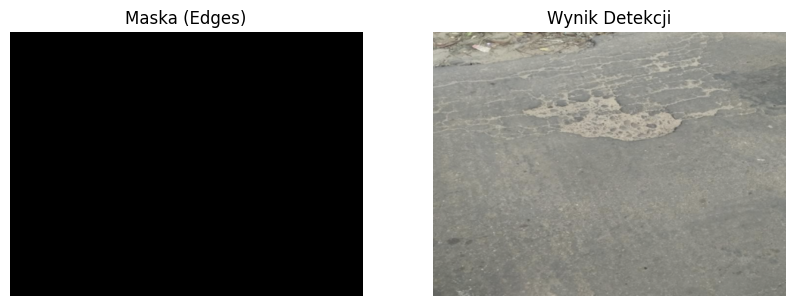

Przetworzono: potholes214.png -> Wykryto: 14


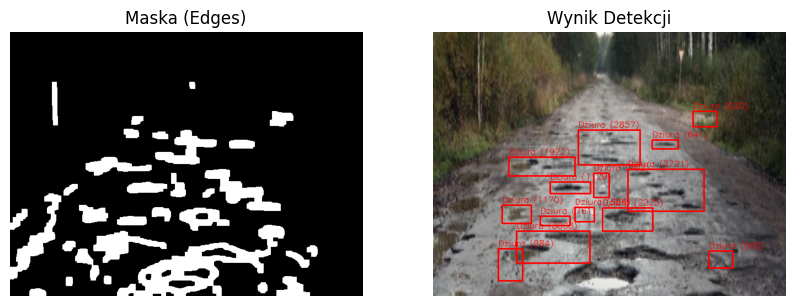

Przetworzono: potholes217.png -> Wykryto: 6


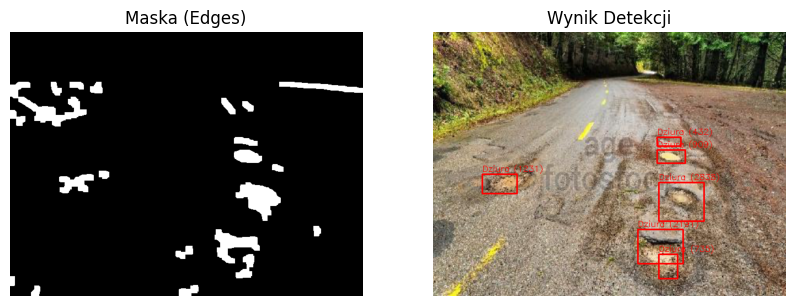

Przetworzono: potholes225.png -> Wykryto: 1


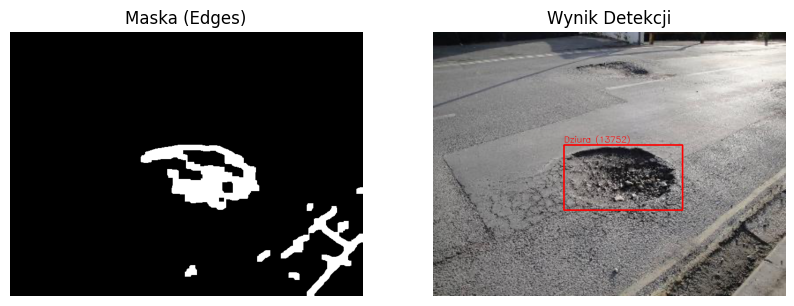

Przetworzono: potholes226.png -> Wykryto: 7


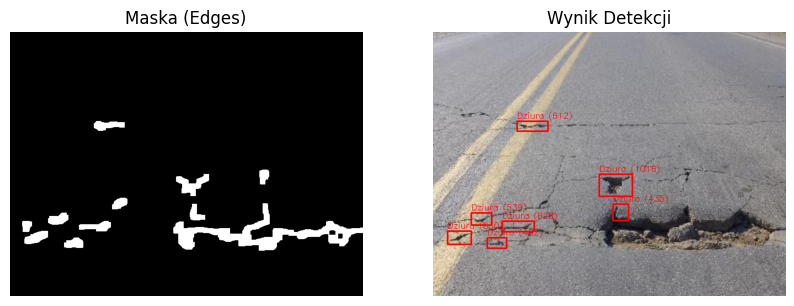

Przetworzono: potholes227.png -> Wykryto: 7


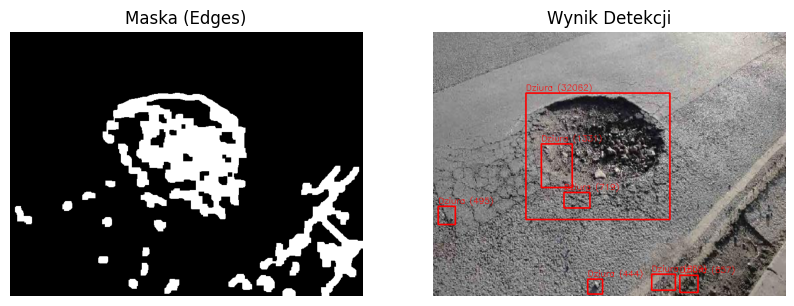

Przetworzono: potholes228.png -> Wykryto: 2


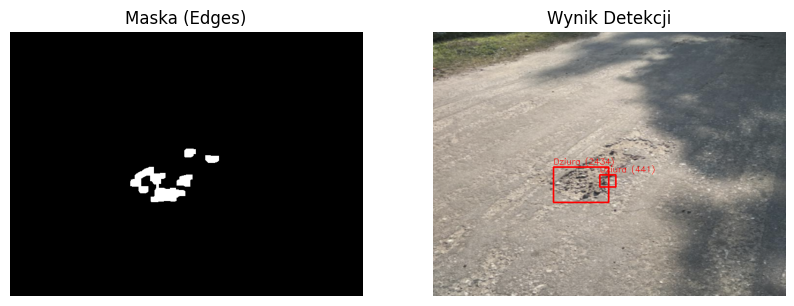

Przetworzono: potholes230.png -> Wykryto: 1


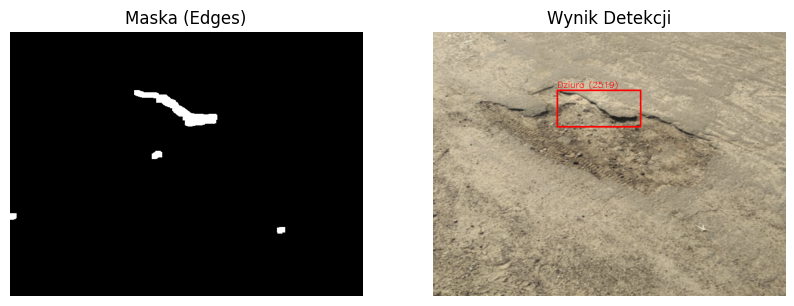

Przetworzono: potholes249.png -> Wykryto: 9


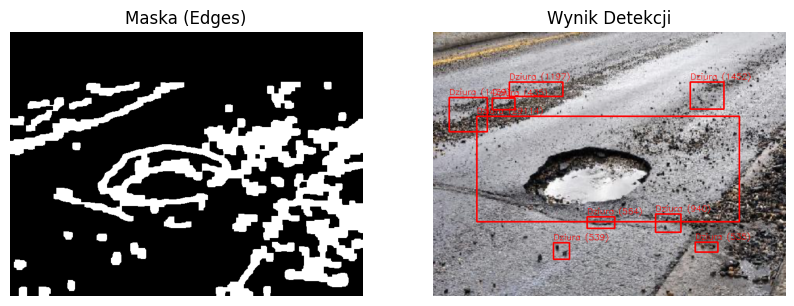

Przetworzono: potholes254.png -> Wykryto: 7


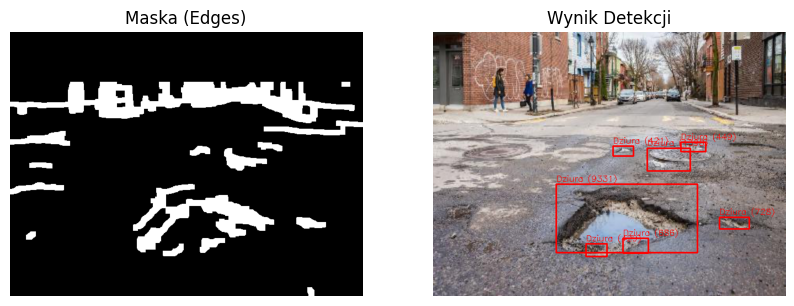

Przetworzono: potholes260.png -> Wykryto: 4


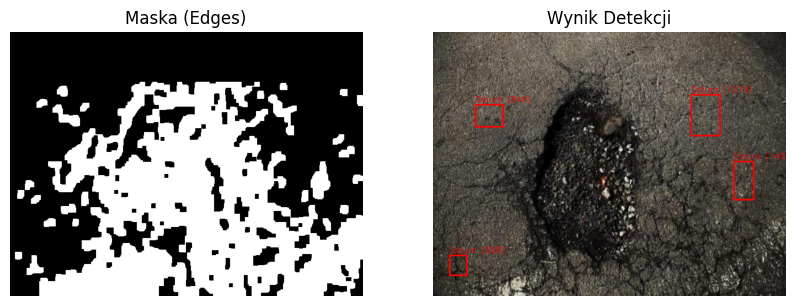

Przetworzono: potholes266.png -> Wykryto: 1


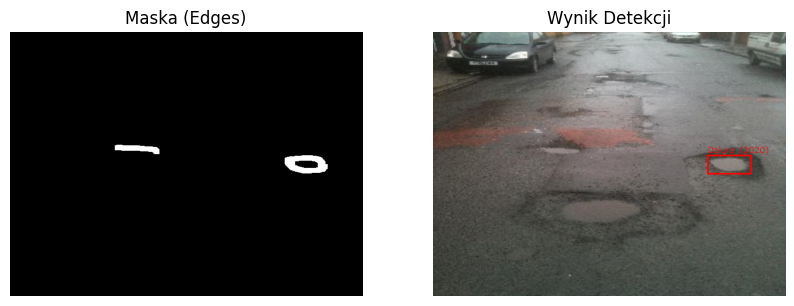

Przetworzono: potholes267.png -> Wykryto: 1


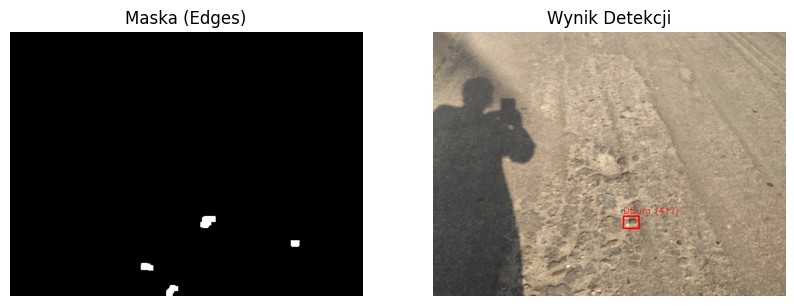

Przetworzono: potholes276.png -> Wykryto: 3


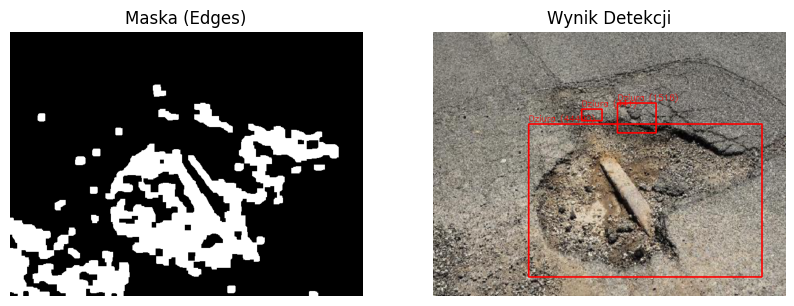

Przetworzono: potholes277.png -> Wykryto: 13


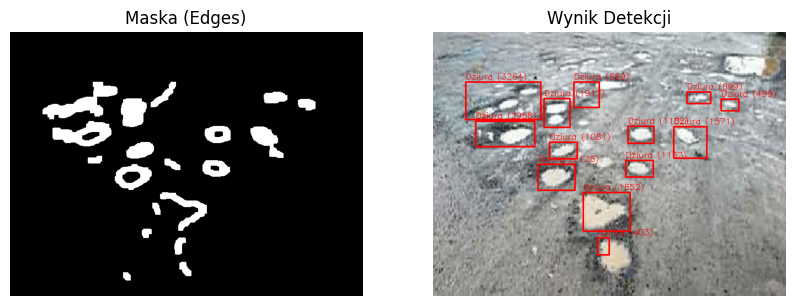

Przetworzono: potholes280.png -> Wykryto: 6


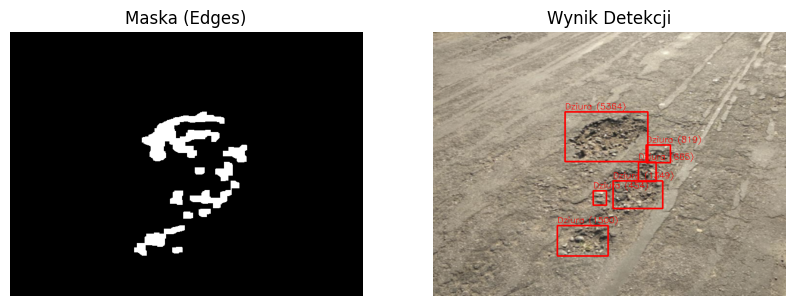

Przetworzono: potholes281.png -> Wykryto: 5


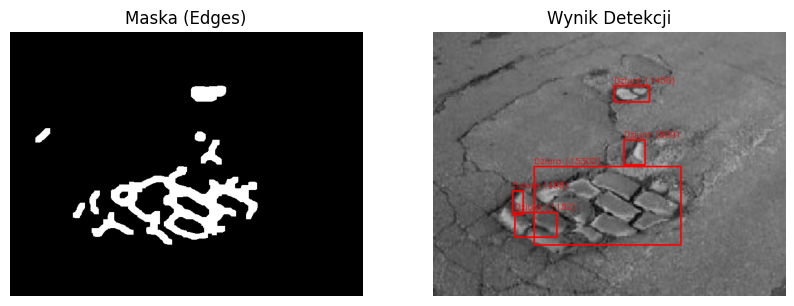

Przetworzono: potholes282.png -> Wykryto: 13


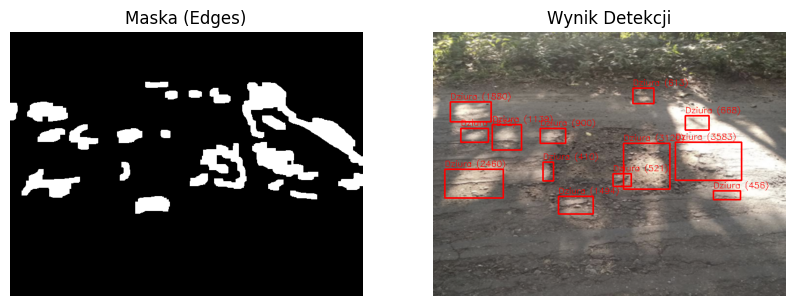

Przetworzono: potholes288.png -> Wykryto: 5


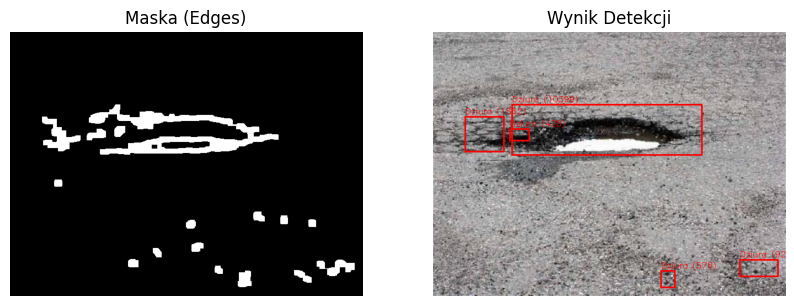

Przetworzono: potholes292.png -> Wykryto: 3


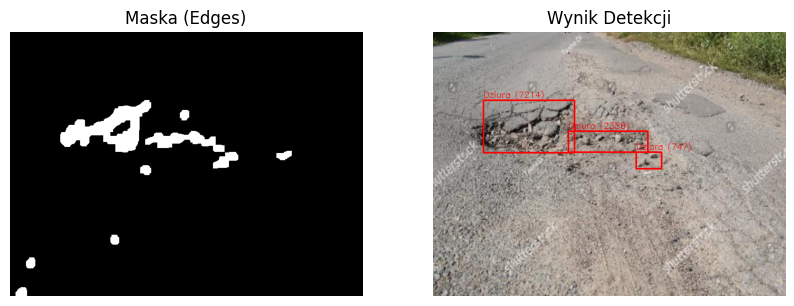

Przetworzono: potholes294.png -> Wykryto: 5


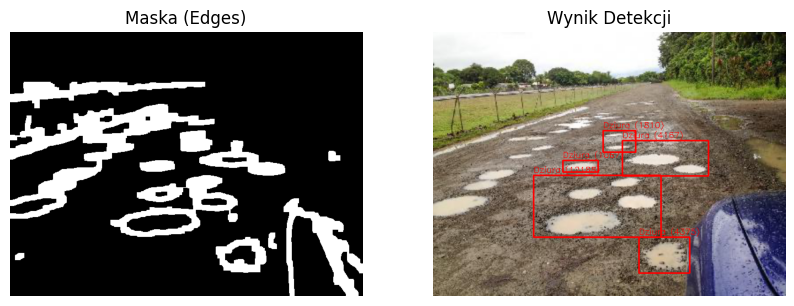

Przetworzono: potholes306.png -> Wykryto: 2


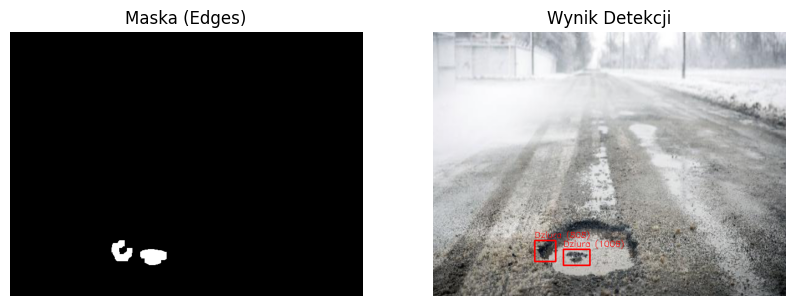

Przetworzono: potholes307.png -> Wykryto: 8


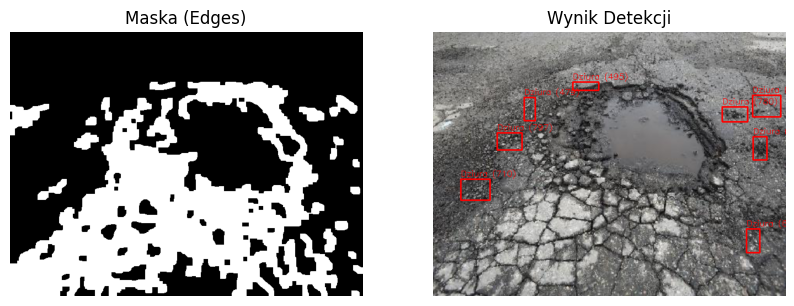

Przetworzono: potholes317.png -> Wykryto: 11


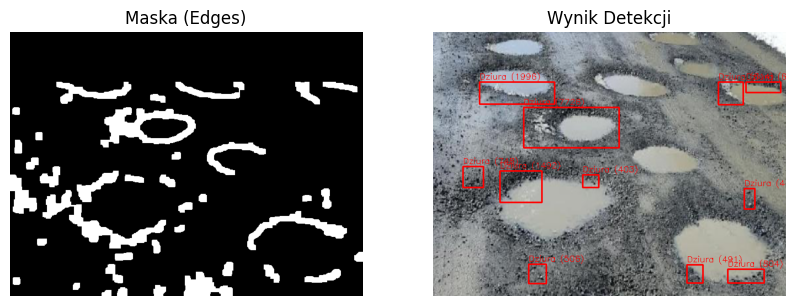

Przetworzono: potholes329.png -> Wykryto: 13


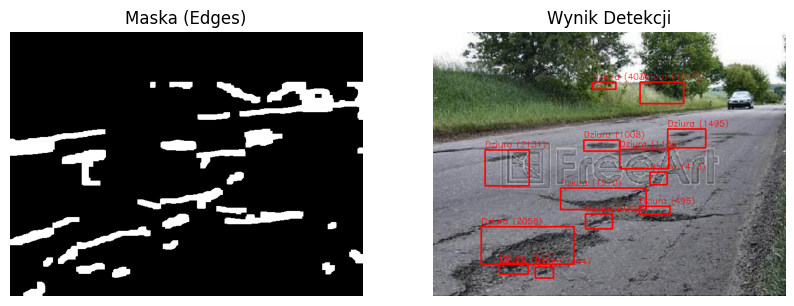

Przetworzono: potholes336.png -> Wykryto: 4


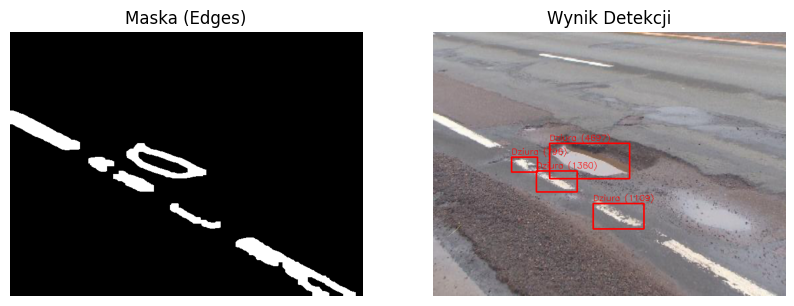

Przetworzono: potholes370.png -> Wykryto: 7


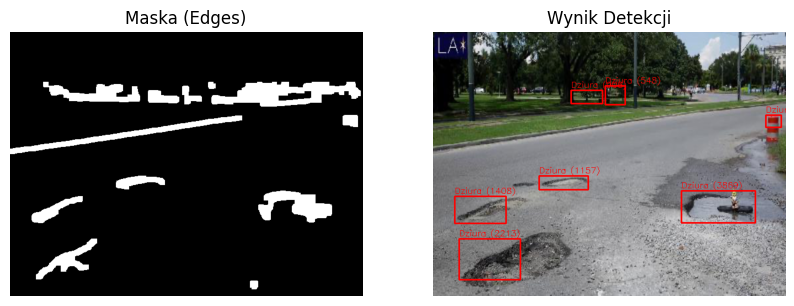

Przetworzono: potholes371.png -> Wykryto: 9


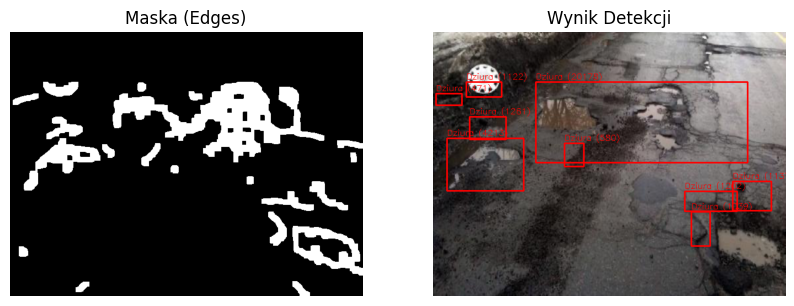

Przetworzono: potholes374.png -> Wykryto: 1


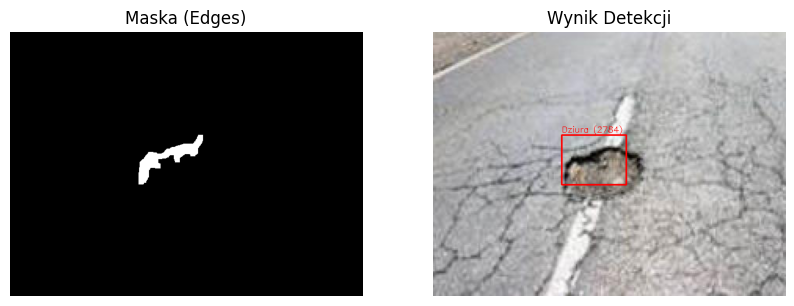

Przetworzono: potholes395.png -> Wykryto: 1


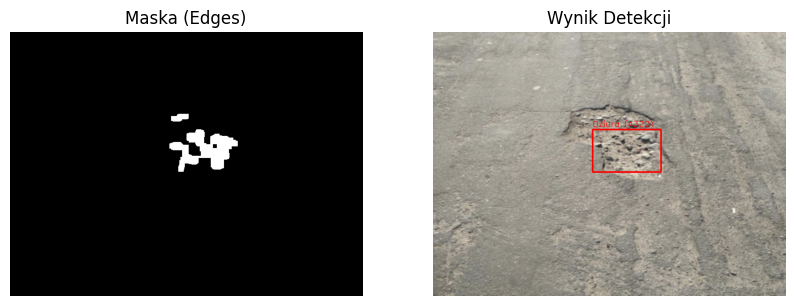

Przetworzono: potholes401.png -> Wykryto: 3


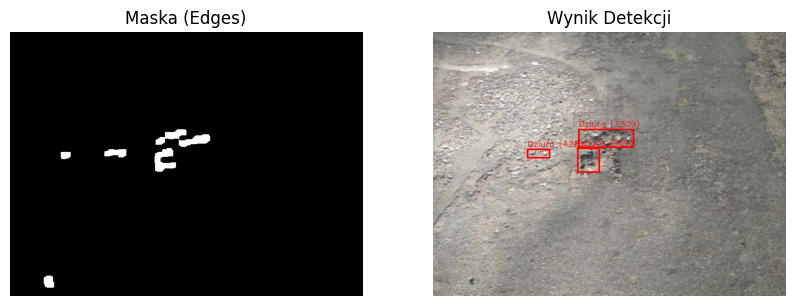

Przetworzono: potholes411.png -> Wykryto: 12


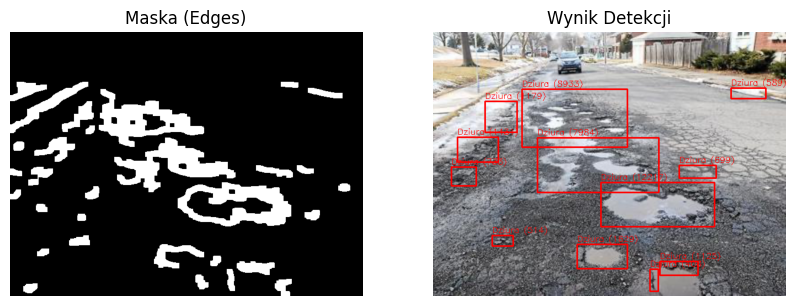

Przetworzono: potholes427.png -> Wykryto: 6


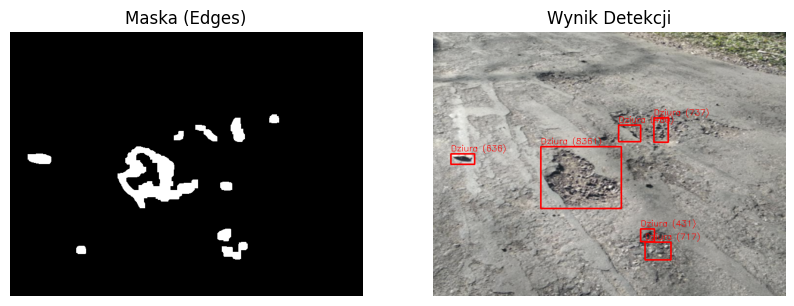

Przetworzono: potholes467.png -> Wykryto: 6


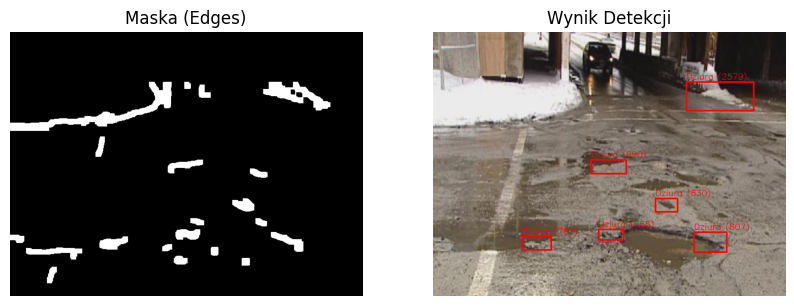

Przetworzono: potholes468.png -> Wykryto: 5


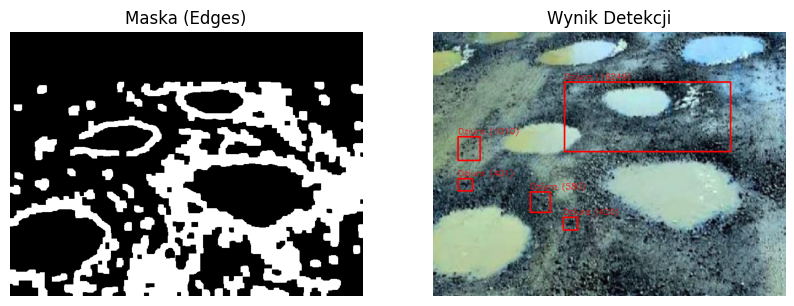

Przetworzono: potholes469.png -> Wykryto: 1


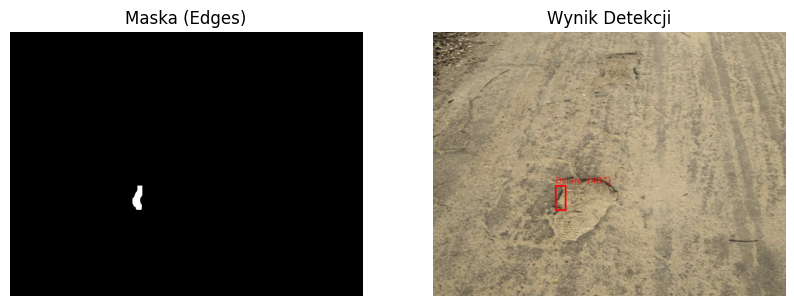

Przetworzono: potholes470.png -> Wykryto: 20


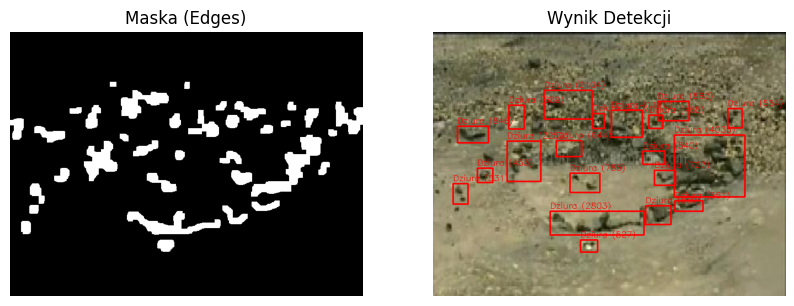

Przetworzono: potholes471.png -> Wykryto: 5


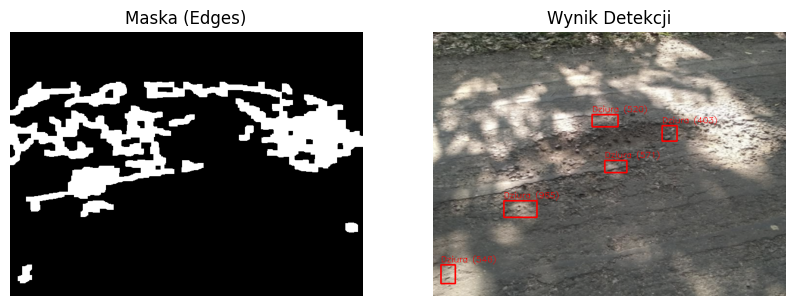

Przetworzono: potholes472.png -> Wykryto: 0


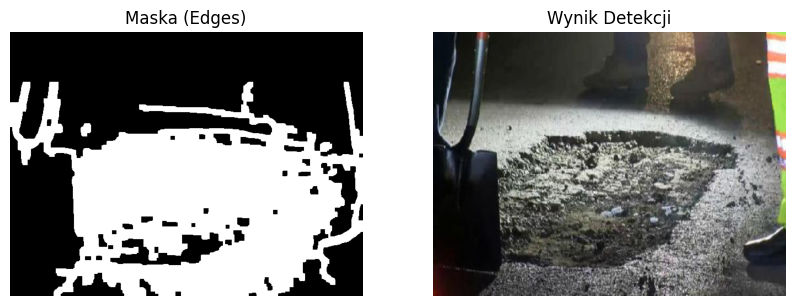

Przetworzono: potholes473.png -> Wykryto: 7


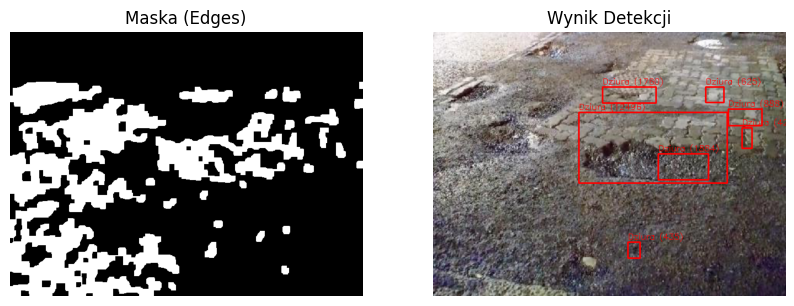

Przetworzono: potholes474.png -> Wykryto: 3


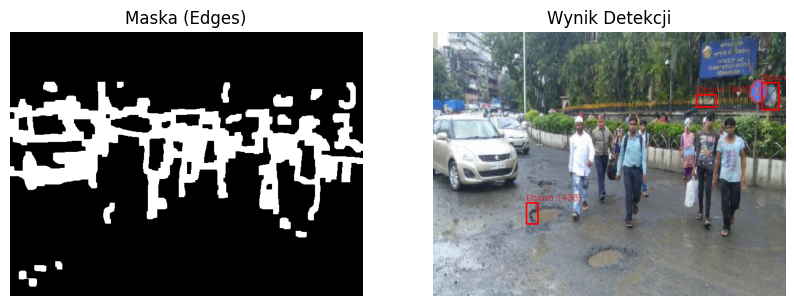

Przetworzono: potholes475.png -> Wykryto: 6


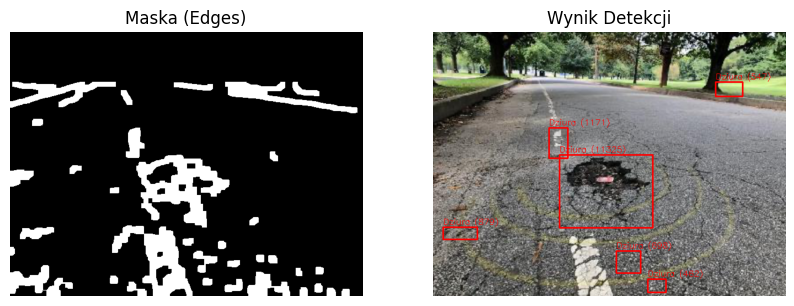

Przetworzono: potholes476.png -> Wykryto: 2


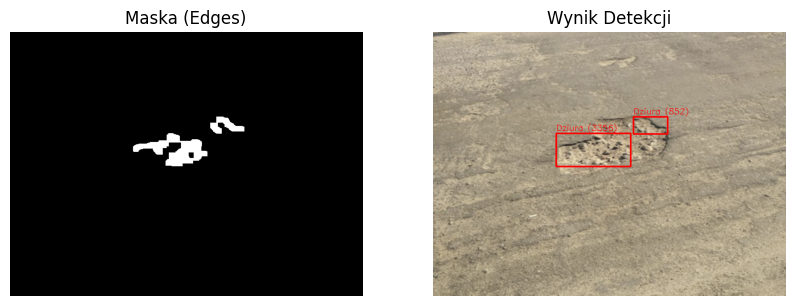

Przetworzono: potholes477.png -> Wykryto: 0


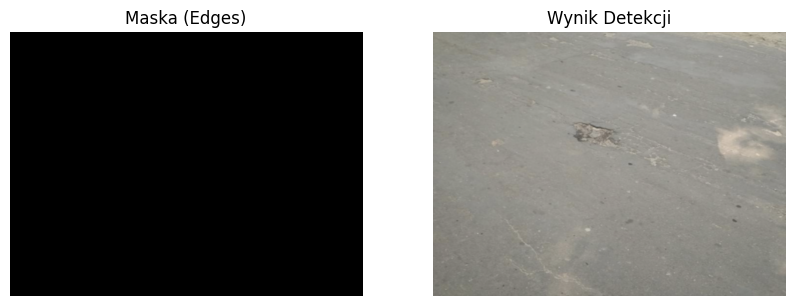

Przetworzono: potholes478.png -> Wykryto: 3


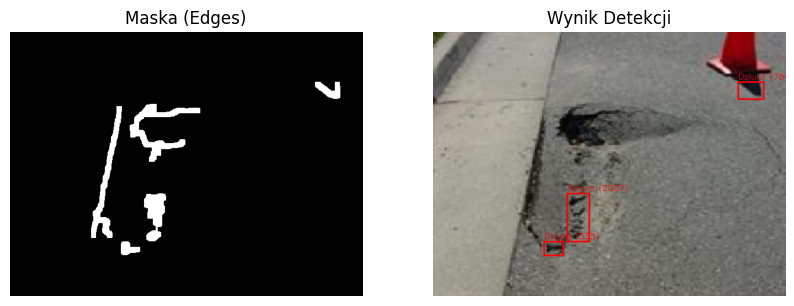

Przetworzono: potholes479.png -> Wykryto: 0


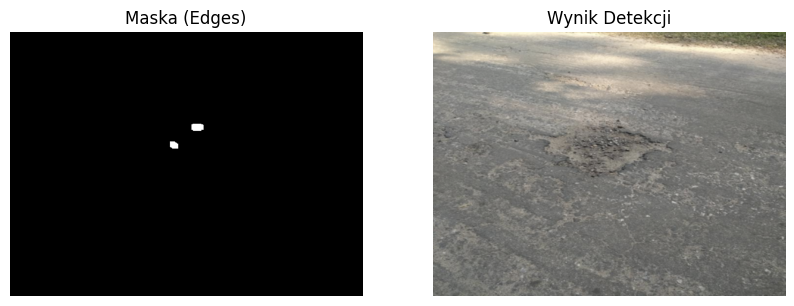

Przetworzono: potholes480.png -> Wykryto: 0


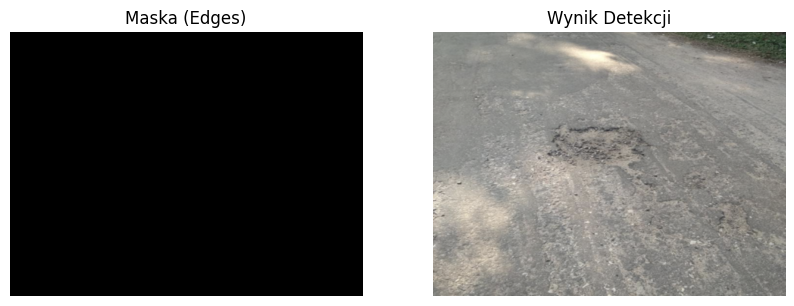

Przetworzono: potholes481.png -> Wykryto: 0


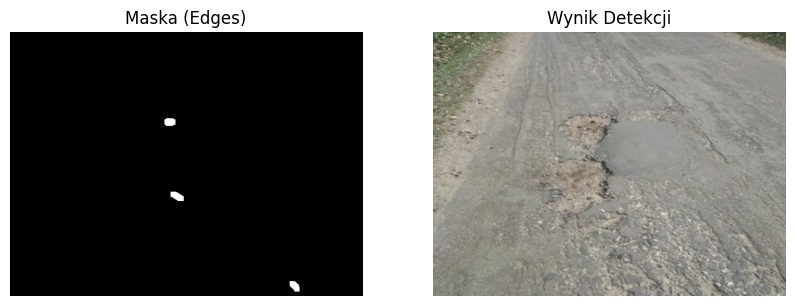

Przetworzono: potholes482.png -> Wykryto: 0


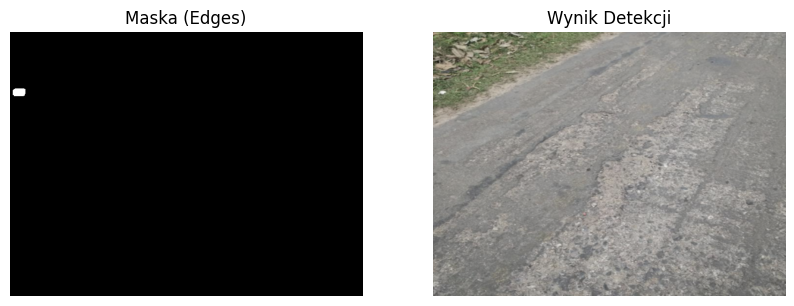

Przetworzono: potholes483.png -> Wykryto: 0


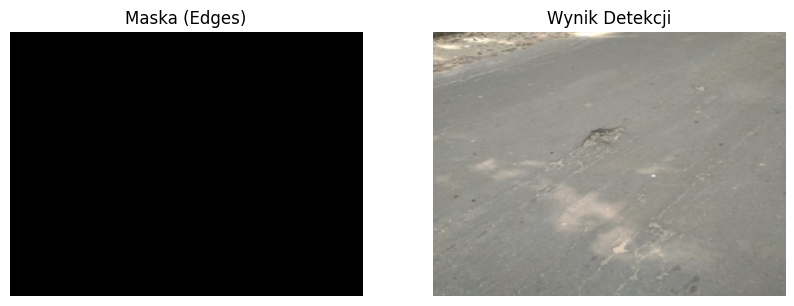

Przetworzono: potholes484.png -> Wykryto: 0


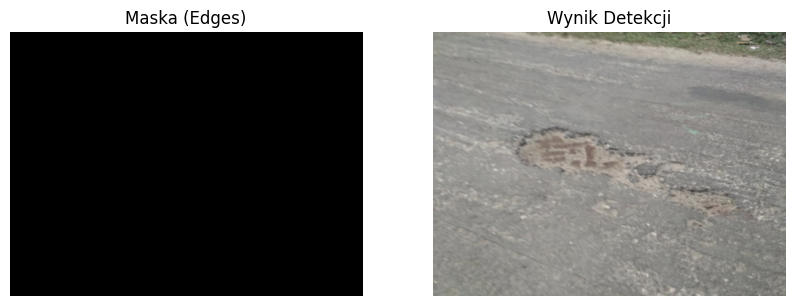

Przetworzono: potholes485.png -> Wykryto: 4


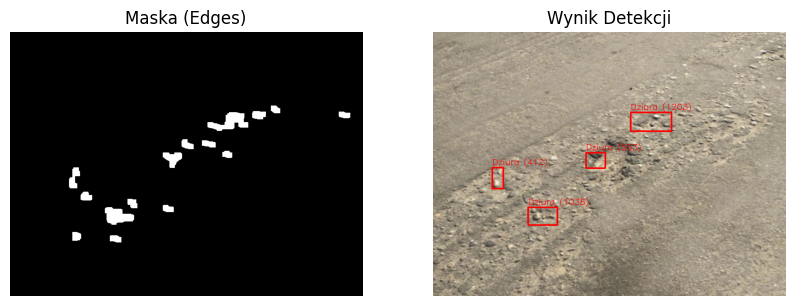

Przetworzono: potholes486.png -> Wykryto: 11


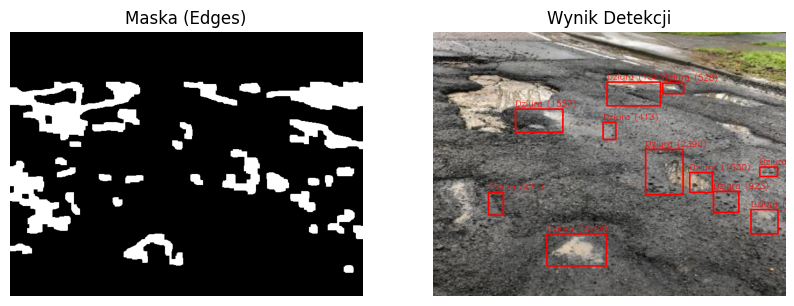

In [17]:
import matplotlib.pyplot as plt

image_paths = list_images(INPUT_DIR)

print(f"Znaleziono {len(image_paths)} obrazów.")

for img_path in image_paths:
    img_bgr = cv2.imread(str(img_path))
    if img_bgr is None:
        continue

    mask, resized_original = process_image_edges(img_bgr)
    final_result, count = detect_and_draw(mask, resized_original)

    print(f"Przetworzono: {img_path.name} -> Wykryto: {count}")

    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(mask, cmap='gray')
    plt.title("Maska (Edges)")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    plt.title("Wynik Detekcji")
    plt.axis('off')
    plt.show()